In [ ]:
!pip install shap

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 540.5/540.5 kB 3.5 MB/s eta 0:00:00


In [ ]:
!pip install catboost

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 98.2/98.2 MB 7.5 MB/s eta 0:00:00


In [ ]:
!pip install lime

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 275.7/275.7 kB 2.2 MB/s eta 0:00:00
  Preparing metadata (setup.py) ... done
  Created wheel for lime: filename=lime-0.2.0.1-py3-none-any.whl size=283835 sha256=efe9ccbd878a3edde7593cdf57d26b53d5d2a7c1570ac746146b96014d50c05d
  Stored in directory: /root/.cache/pip/wheels/fd/a2/af/9ac0a1a85a27f314a06b39e1f492bee1547d52549a4606ed89
Successfully built lime


In [ ]:
!pip install scikit-learn scikit-optimize

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 107.7/107.7 kB 1.1 MB/s eta 0:00:00


In [ ]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import shap
import lime
from lime import lime_tabular

from sklearn.model_selection import train_test_split, GridSearchCV
from sklearn.ensemble import RandomForestRegressor
from sklearn.svm import SVR
from catboost import CatBoostRegressor
from sklearn.metrics import accuracy_score, mean_squared_error, r2_score

In [ ]:
df = pd.read_csv('/content/white-wine-data.csv')
df.head()

,fixed acidity,volatile acidity,citric acid,residual sugar,chlorides,free sulfur dioxide,total sulfur dioxide,density,pH,sulphates,alcohol,quality
0,7.0,0.27,0.36,20.7,0.045,45.0,170.0,1.0010,3.00,0.45,8.8,6
1,6.3,0.30,0.34,1.6,0.049,14.0,132.0,0.9940,3.30,0.49,9.5,6
2,8.1,0.28,0.40,6.9,0.050,30.0,97.0,0.9951,3.26,0.44,10.1,6
3,7.2,0.23,0.32,8.5,0.058,47.0,186.0,0.9956,3.19,0.40,9.9,6
4,7.2,0.23,0.32,8.5,0.058,47.0,186.0,0.9956,3.19,0.40,9.9,6


In [ ]:
df.shape

(4898, 12)

In [ ]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 4898 entries, 0 to 4897
Data columns (total 12 columns):
 #   Column                Non-Null Count  Dtype  
---  ------                --------------  -----  
 0   fixed acidity         4898 non-null   float64
 1   volatile acidity      4898 non-null   float64
 2   citric acid           4898 non-null   float64
 3   residual sugar        4898 non-null   float64
 4   chlorides             4898 non-null   float64
 5   free sulfur dioxide   4898 non-null   float64
 6   total sulfur dioxide  4898 non-null   float64
 7   density               4898 non-null   float64
 8   pH                    4898 non-null   float64
 9   sulphates             4898 non-null   float64
 10  alcohol               4898 non-null   float64
 11  quality               4898 non-null   int64  
dtypes: float64(11), int64(1)
memory usage: 459.3 KB


In [ ]:
df.isnull().sum()

fixed acidity           0
volatile acidity        0
citric acid             0
residual sugar          0
chlorides               0
free sulfur dioxide     0
total sulfur dioxide    0
density                 0
pH                      0
sulphates               0
alcohol                 0
quality                 0
dtype: int64

In [ ]:
value_counts = df['quality'].value_counts()
print(value_counts)

quality
6    2198
5    1457
7     880
8     175
4     163
3      20
9       5
Name: count, dtype: int64


In [ ]:
column_list = df.columns
print(column_list)

Index(['fixed acidity', 'volatile acidity', 'citric acid', 'residual sugar',
       'chlorides', 'free sulfur dioxide', 'total sulfur dioxide', 'density',
       'pH', 'sulphates', 'alcohol', 'quality'],
      dtype='object')


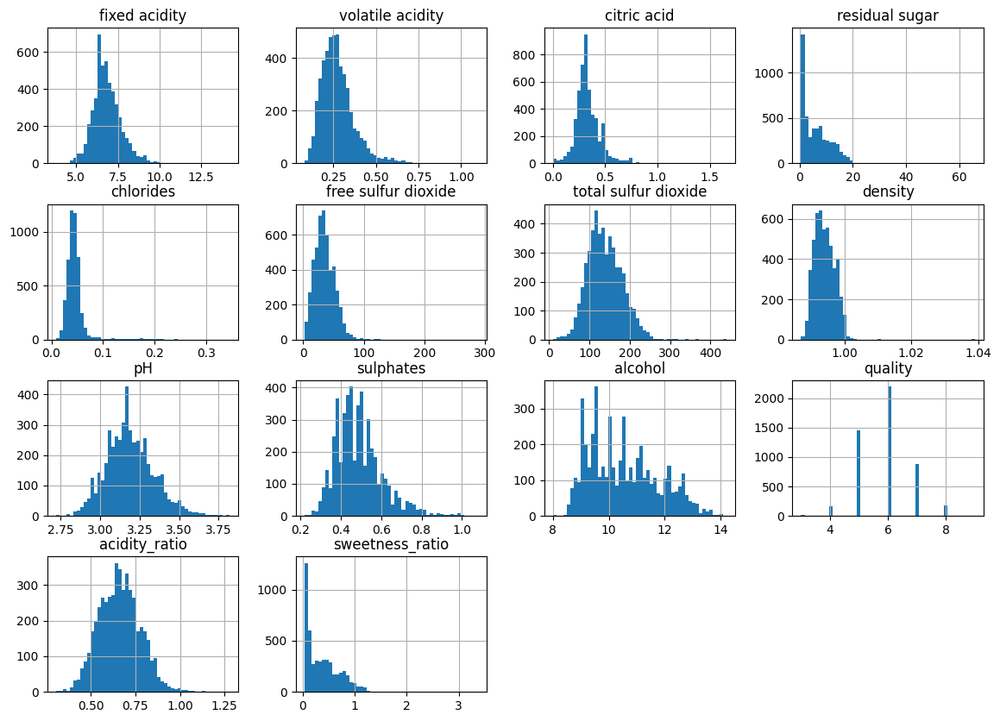

In [ ]:
df.hist(bins=50, figsize=(14, 10))
plt.show()

<Axes: xlabel='alcohol', ylabel='Count'>

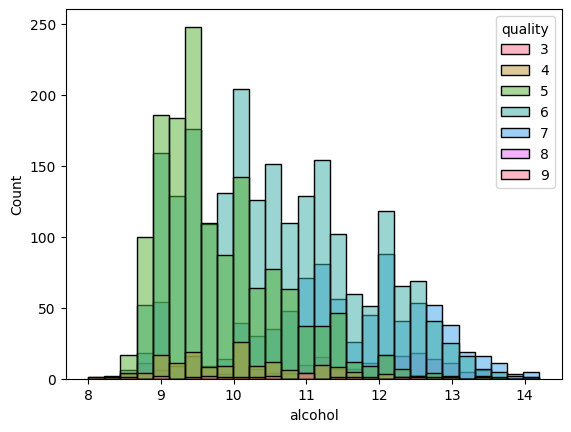

In [ ]:
sns.histplot(df, x="alcohol", hue="quality", palette="husl")

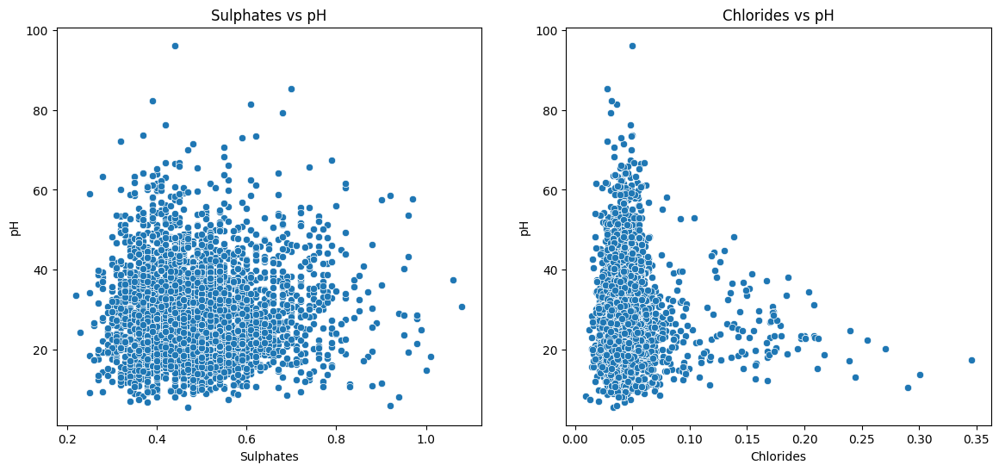

In [ ]:
fig, axes = plt.subplots(1, 2, figsize=(14, 6))

sns.scatterplot(x='sulphates', y='acidity_ratio', data=df, ax=axes[0])
axes[0].set_title('Sulphates vs pH')
axes[0].set_xlabel('Sulphates')
axes[0].set_ylabel('pH')

sns.scatterplot(x='chlorides', y='acidity_ratio', data=df, ax=axes[1])
axes[1].set_title('Chlorides vs pH')
axes[1].set_xlabel('Chlorides')
axes[1].set_ylabel('pH')

plt.show()

<ipython-input-148-b3bca9b98694>:1: UserWarning: Ignoring `palette` because no `hue` variable has been assigned.
  sns.histplot(df, x="density", y="pH", palette="husl")


<Axes: xlabel='density', ylabel='pH'>

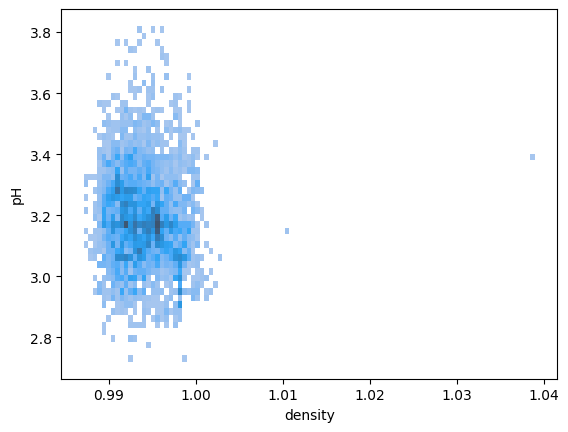

In [ ]:
sns.histplot(df, x="density", y="pH", palette="husl")

<Axes: xlabel='free sulfur dioxide', ylabel='total sulfur dioxide'>

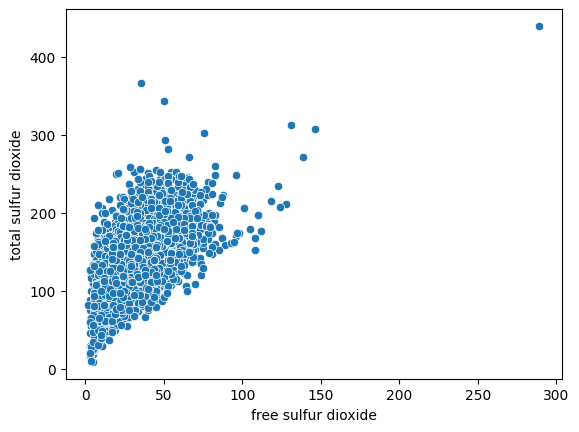

In [ ]:
sns.scatterplot(x='free sulfur dioxide', y='total sulfur dioxide', data=df)

In [ ]:
#Info of outliers
outlier_threshold = 7

outliers = pd.DataFrame()
for feature_x, feature_y in [('free sulfur dioxide', 'total sulfur dioxide')]:

    outliers_features = df[((df[feature_x] > df[feature_x].mean() + outlier_threshold * df[feature_x].std()) |
                           (df[feature_y] > df[feature_y].mean() + outlier_threshold * df[feature_y].std()))]
    outliers = pd.concat([outliers, outliers_features])
    print(f"Number of outliers for {feature_x} and {feature_y}: {len(outliers_features)}")
    print(outliers_features)
    print()

Number of outliers for free sulfur dioxide and total sulfur dioxide: 1
      fixed acidity  volatile acidity  citric acid  residual sugar  chlorides  \
4745            6.1              0.26         0.25             2.9      0.047   

      free sulfur dioxide  total sulfur dioxide  density    pH  sulphates  \
4745                289.0                 440.0  0.99314  3.44       0.64   

      alcohol  quality  
4745     10.5        3  



In [ ]:
outlier_threshold = 7

outliers = pd.DataFrame()
outlier_summary = ""

for feature_x, feature_y in [('free sulfur dioxide', 'total sulfur dioxide')]:
    outliers_features = df[((df[feature_x] > df[feature_x].mean() + outlier_threshold * df[feature_x].std()) |
                            (df[feature_y] > df[feature_y].mean() + outlier_threshold * df[feature_y].std()))]
    outliers = pd.concat([outliers, outliers_features])

    outlier_info = f"Number of outliers for {feature_x} and {feature_y}: {len(outliers_features)}\n"
    outlier_info += outliers_features.to_string() + "\n\n"
    outlier_summary += outlier_info

print(outlier_summary)

Number of outliers for free sulfur dioxide and total sulfur dioxide: 1
      fixed acidity  volatile acidity  citric acid  residual sugar  chlorides  free sulfur dioxide  total sulfur dioxide  density    pH  sulphates  alcohol  quality
4745            6.1              0.26         0.25             2.9      0.047                289.0                 440.0  0.99314  3.44       0.64     10.5        3




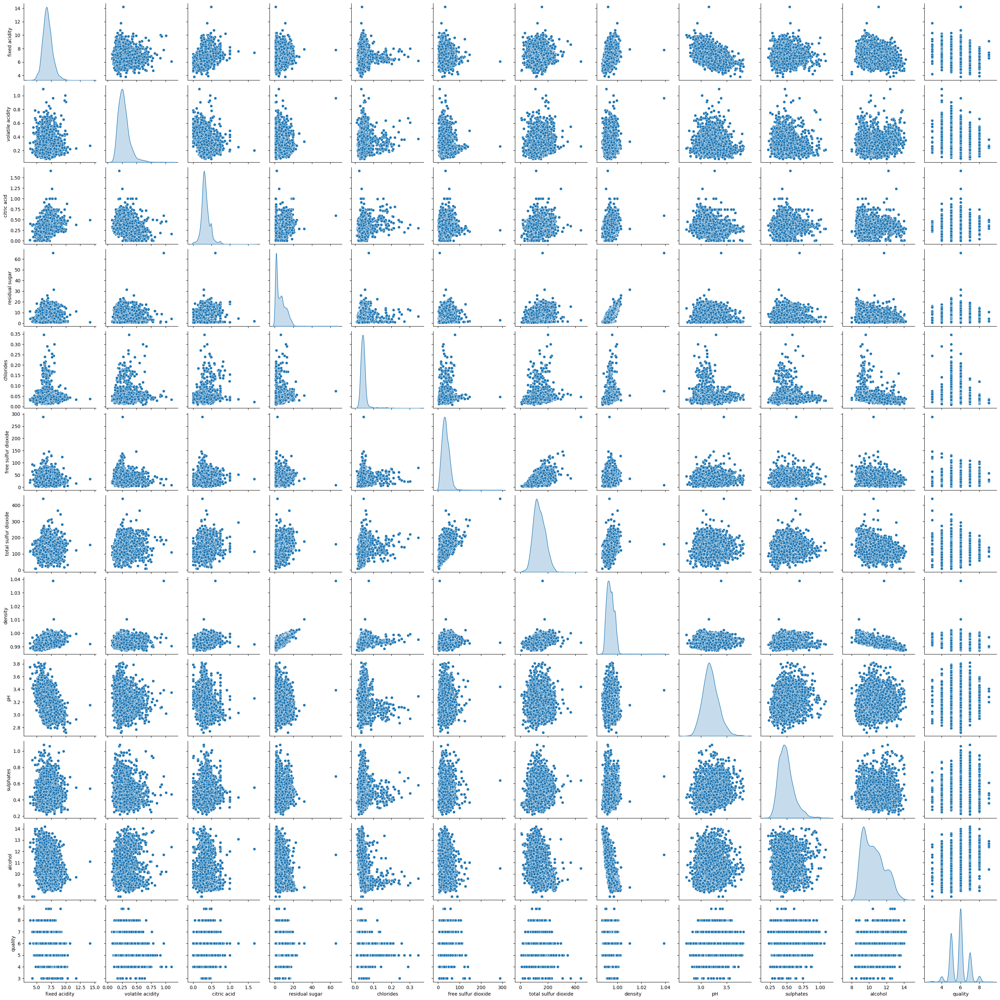

In [ ]:
sns.pairplot(df, diag_kind='kde')
plt.show()

In [ ]:
outlier_threshold = 7
outliers = pd.DataFrame()
outlier_summary = ""

for feature_x, feature_y in [('fixed acidity', 'pH'), ('citric acid', 'pH'), ('volatile acidity', 'pH'), ('residual sugar', 'pH')]:
    outliers_feature = df[((df[feature_x] > df[feature_x].mean() + outlier_threshold * df[feature_x].std()) |
                           (df[feature_y] > df[feature_y].mean() + outlier_threshold * df[feature_y].std()))]
    outliers = pd.concat([outliers, outliers_feature])

    outlier_info = f"Number of outliers for {feature_x} and {feature_y}: {len(outliers_feature)}\n"
    outlier_info += outliers_feature.to_string() + "\n\n\n"
    outlier_summary += outlier_info

print(outlier_summary)

Number of outliers for fixed acidity and pH: 1
      fixed acidity  volatile acidity  citric acid  residual sugar  chlorides  free sulfur dioxide  total sulfur dioxide  density    pH  sulphates  alcohol  quality
1526           14.2              0.27         0.49             1.1      0.037                 33.0                 156.0    0.992  3.15       0.54     11.1        6


Number of outliers for citric acid and pH: 2
      fixed acidity  volatile acidity  citric acid  residual sugar  chlorides  free sulfur dioxide  total sulfur dioxide  density    pH  sulphates  alcohol  quality
745             7.4              0.20         1.66             2.1      0.022                 34.0                 113.0  0.99165  3.26       0.55     12.2        6
3152            7.6              0.25         1.23             4.6      0.035                 51.0                 294.0  0.99018  3.03       0.43     13.1        6


Number of outliers for volatile acidity and pH: 2
      fixed acidity  volatile

In [ ]:
feature = "alcohol"
range_min = df[feature].min()
range_max = df[feature].max()

print(f"Range: {range_min},{range_max}")

low_threshold = range_min + (range_max - range_min) * 0.33
high_threshold = range_min + (range_max - range_min) * 0.67

df[f"{feature}_category"] = pd.cut(df["alcohol"], bins=[range_min, low_threshold, high_threshold, range_max], labels=["low", "medium", "high"])

print(df[f"{feature}_category"].value_counts())

Range: 8.0,14.2
alcohol_category
medium    2156
low       2084
high       656
Name: count, dtype: int64


<ipython-input-20-e23103f29700>:2: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(x='alcohol_category', y='quality', data=df, palette='viridis')


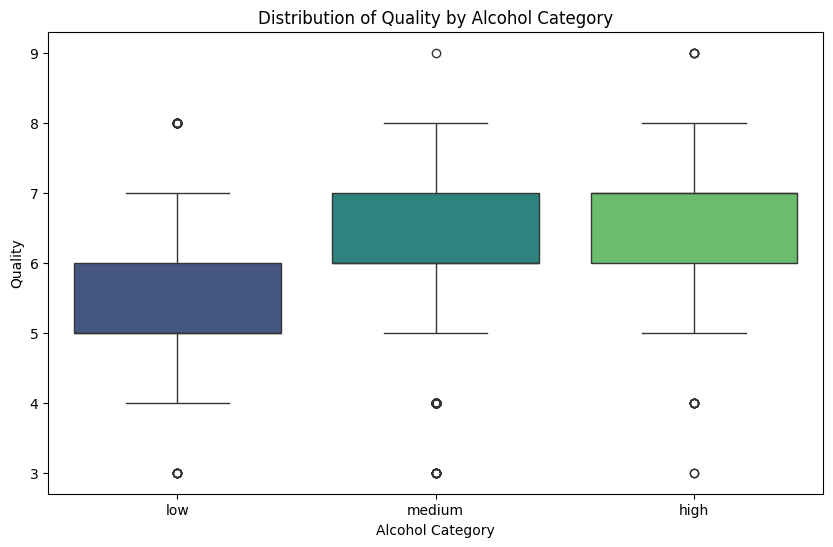

In [ ]:
plt.figure(figsize=(10, 6))
sns.boxplot(x='alcohol_category', y='quality', data=df, palette='viridis')
plt.xlabel('Alcohol Category')
plt.ylabel('Quality')
plt.title('Distribution of Quality by Alcohol Category')
plt.show()

In [ ]:
feature_name= 'alcohol_category'
box_details = df.groupby(feature_name)['quality'].describe()

print("Box Details:")
print(box_details)

Box Details:
                   count      mean       std  min  25%  50%  75%  max
alcohol_category                                                     
low               2084.0  5.516315  0.736030  3.0  5.0  5.0  6.0  8.0
medium            2156.0  6.010204  0.864826  3.0  6.0  6.0  7.0  9.0
high               656.0  6.597561  0.821241  3.0  6.0  7.0  7.0  9.0


Feature engineering

In [ ]:
df['acidity_ratio'] = (df['fixed acidity'] + df['citric acid'])/ df['volatile acidity']
df['sweetness_ratio'] = df['residual sugar'] / (df['fixed acidity'] + df['alcohol'])
df.head()

,fixed acidity,volatile acidity,citric acid,residual sugar,chlorides,free sulfur dioxide,total sulfur dioxide,density,pH,sulphates,alcohol,quality,alcohol_category,acidity_ratio,sweetness_ratio
0,7.0,0.27,0.36,20.7,0.045,45.0,170.0,1.0010,3.00,0.45,8.8,6,low,27.259259,1.310127
1,6.3,0.30,0.34,1.6,0.049,14.0,132.0,0.9940,3.30,0.49,9.5,6,low,22.133333,0.101266
2,8.1,0.28,0.40,6.9,0.050,30.0,97.0,0.9951,3.26,0.44,10.1,6,medium,30.357143,0.379121
3,7.2,0.23,0.32,8.5,0.058,47.0,186.0,0.9956,3.19,0.40,9.9,6,low,32.695652,0.497076
4,7.2,0.23,0.32,8.5,0.058,47.0,186.0,0.9956,3.19,0.40,9.9,6,low,32.695652,0.497076


<ipython-input-136-9af1f1dc4141>:2: UserWarning: Ignoring `palette` because no `hue` variable has been assigned.
  sns.scatterplot(x='sweetness_ratio', y='quality', data=df, palette='viridis')


<Axes: xlabel='sweetness_ratio', ylabel='quality'>

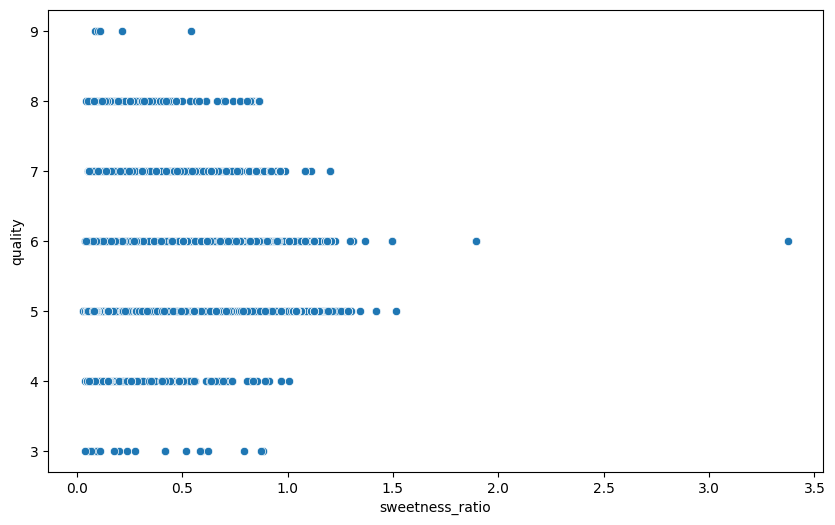

In [ ]:
plt.figure(figsize=(10, 6))
sns.scatterplot(x='sweetness_ratio', y='quality', data=df, palette='viridis')

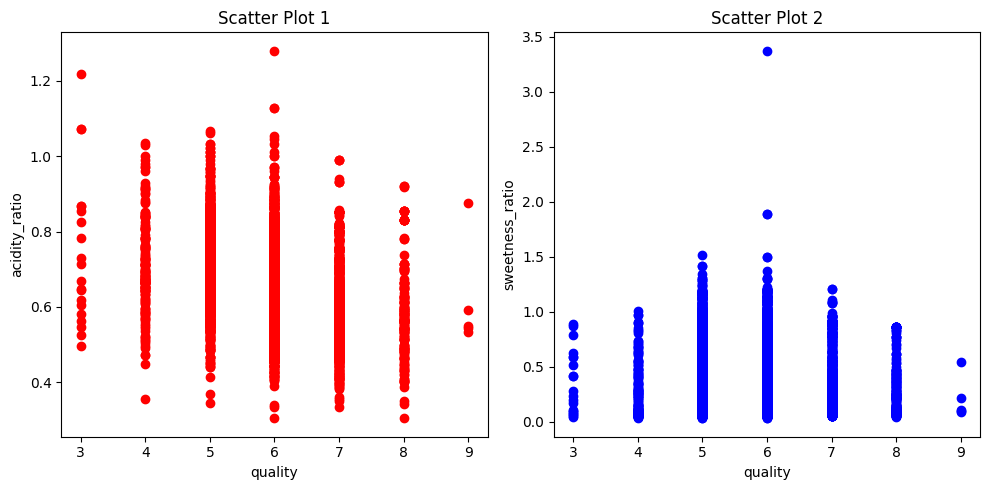

In [ ]:
fig, axs = plt.subplots(1, 2, figsize=(10, 5))

axs[0].scatter('quality', 'acidity_ratio', data=df,  color='red')
axs[0].set_title('Scatter Plot 1')
axs[0].set_xlabel('quality')
axs[0].set_ylabel('acidity_ratio')

axs[1].scatter('quality', 'sweetness_ratio',data=df, color='blue')
axs[1].set_title('Scatter Plot 2')
axs[1].set_xlabel('quality')
axs[1].set_ylabel('sweetness_ratio')

plt.tight_layout()
plt.show()

In [ ]:
outlier_threshold = 3

outliers = pd.DataFrame()
outlier_summary = ""

for feature_x, feature_y in [('acidity_ratio', 'sweetness_ratio')]:
    outliers_features = df[((df[feature_x] > df[feature_x].mean() + outlier_threshold * df[feature_x].std()) |
                            (df[feature_y] > df[feature_y].mean() + outlier_threshold * df[feature_y].std()))]
    outliers = pd.concat([outliers, outliers_features])

    outlier_info = f"Number of outliers for {feature_x} and {feature_y}: {len(outliers_features)}\n"
    outlier_info += outliers_features.to_string() + "\n\n"
    outlier_summary += outlier_info

outliers = outliers.drop_duplicates()
outlier_summary += f"Total number of unique outliers: {len(outliers)}\n"

print(outlier_summary)

Number of outliers for acidity_ratio and sweetness_ratio: 31
      fixed acidity  volatile acidity  citric acid  residual sugar  chlorides  free sulfur dioxide  total sulfur dioxide  density    pH  sulphates  alcohol  quality alcohol_category  acidity_ratio  sweetness_ratio
182             6.8             0.280         0.40           22.00      0.048                 48.0                 167.0  1.00100  2.93       0.50      8.7        5              low       0.781609         1.419355
191             6.8             0.280         0.40           22.00      0.048                 48.0                 167.0  1.00100  2.93       0.50      8.7        5              low       0.781609         1.419355
207            10.2             0.440         0.88            6.20      0.049                 20.0                 124.0  0.99680  2.99       0.51      9.9        4              low       1.030303         0.308458
294             9.1             0.590         0.38            1.60      0.066      

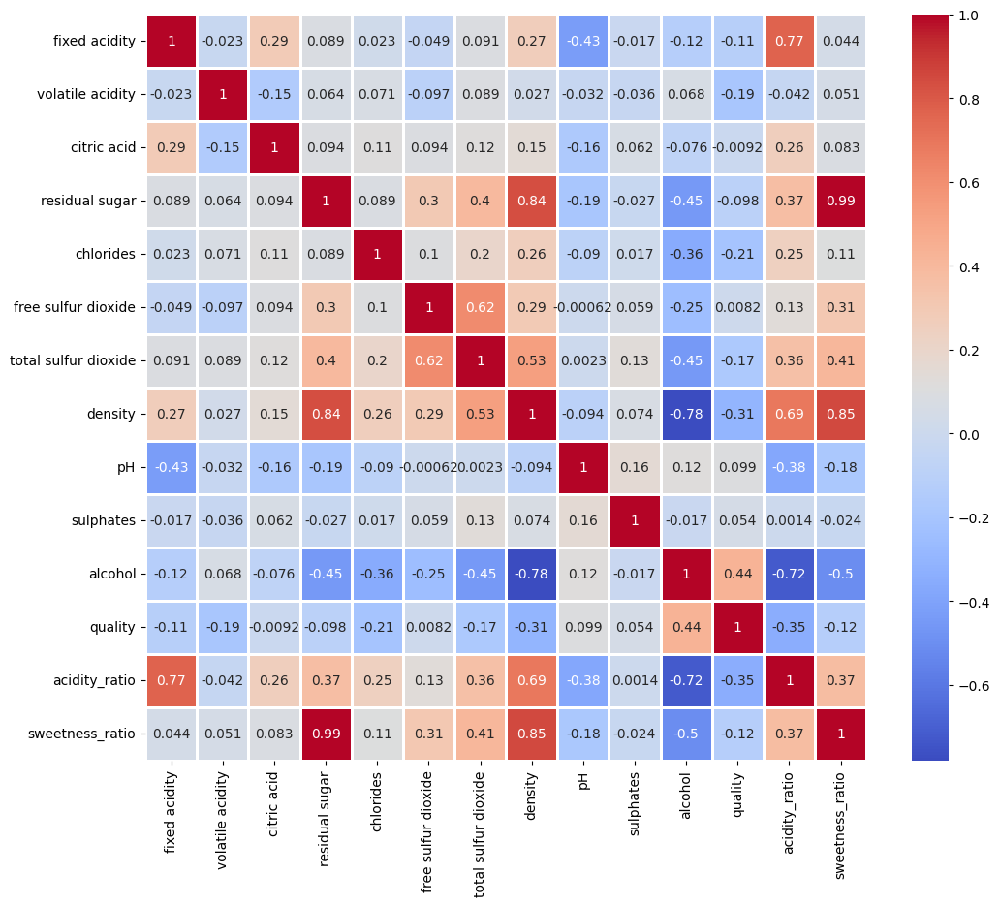

In [ ]:
plt.figure(figsize=(12, 10))
sns.heatmap(df.corr(numeric_only=True), annot=True, cmap='coolwarm', linewidths=2)
plt.show()

In [ ]:
df = df[~df.isin([np.inf, -np.inf, np.NaN])]
#The acidity ratio for a sample equals to infinity which doesn't allow to
#perfrom scaling the data. So, that row has to be removed.

In [ ]:
X = df.drop(columns=['quality', 'alcohol_category'], axis=1)
y = df['quality']

In [ ]:
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

Random Forest Model

In [ ]:
rf_model = RandomForestRegressor(random_state=42)
rf_model.fit(X_train, y_train)

RandomForestRegressor(random_state=42)

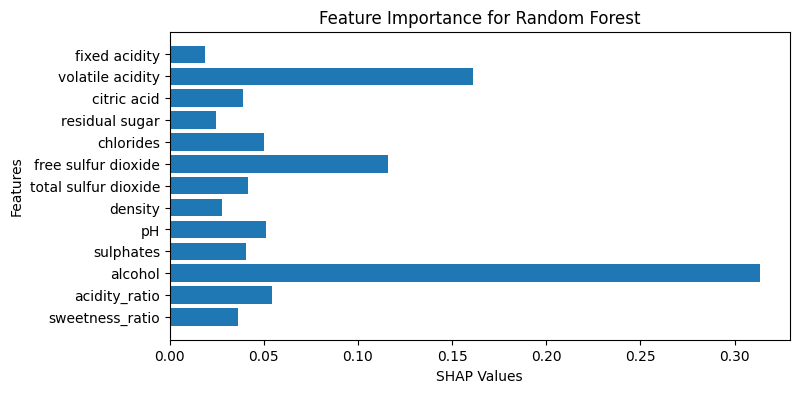

In [ ]:
# SHAP techniques gives a general overview of how the features are weighed by the model used.

feature_names = X.columns.tolist()
X_train_df = pd.DataFrame(X_train, columns=feature_names)

explainer = shap.TreeExplainer(rf_model)
shap_values = explainer.shap_values(X_train_df)
shap_values_abs_mean = np.abs(shap_values).mean(axis=0)

plt.figure(figsize=(8, 4))
plt.barh(range(len(X_train_df.columns)), shap_values_abs_mean, align='center')
plt.yticks(range(len(X_train_df.columns)), feature_names)
plt.xlabel('SHAP Values')
plt.ylabel('Features')
plt.title('Feature Importance for Random Forest')
plt.gca().invert_yaxis()
plt.show()

In [ ]:
X_test = X_test.reset_index(drop=True)
print(X_test.index)

RangeIndex(start=0, stop=980, step=1)


In [ ]:
#Lime technique takes an instance and use that instance to show how the values of those features impact the quality.
#Here, instance no. '3' is used.
rf_explainer = lime_tabular.LimeTabularExplainer(training_data=np.array(X_train), feature_names=X_train.columns, mode='regression')
rf_exp = rf_explainer.explain_instance(data_row=X_test.iloc[3], predict_fn=rf_model.predict)
rf_exp.show_in_notebook(show_table=True)

/usr/local/lib/python3.10/dist-packages/sklearn/base.py:439: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(


Support Vector Regression

In [ ]:
svr_model = SVR(kernel ='rbf')
svr_model.fit(X_train, y_train)

SVR()

In [ ]:
explainer = shap.KernelExplainer(svr_model.predict, shap.kmeans(X_train_df, 10))
shap_values = explainer.shap_values(X_train)
shap_values_abs_mean = np.abs(shap_values).mean(axis=0)

plt.figure(figsize=(8, 4))
plt.barh(range(len(X_train_df.columns)), shap_values_abs_mean, align='center')
plt.yticks(range(len(X_train_df.columns)), feature_names)
plt.xlabel('SHAP Values')
plt.ylabel('Features')
plt.title('Feature Importance for SVR')
plt.gca().invert_yaxis()
plt.show()

  0%|          | 0/3918 [00:00<?, ?it/s]

KeyboardInterrupt: 

In [ ]:
svr_explainer = lime_tabular.LimeTabularExplainer(training_data=np.array(X_train), feature_names=X_train.columns, mode='regression')
svr_exp = svr_explainer.explain_instance(data_row=X_test.iloc[3], predict_fn=svr_model.predict)
svr_exp.show_in_notebook(show_table=True)

/usr/local/lib/python3.10/dist-packages/sklearn/base.py:439: UserWarning: X does not have valid feature names, but SVR was fitted with feature names
  warnings.warn(


CatBoost

In [ ]:
cat_model = CatBoostRegressor(random_state=42)
cat_model.fit(X_train, y_train, eval_set=(X_test, y_test))

Learning rate set to 0.063097
0:	learn: 0.8720527	test: 0.8672558	best: 0.8672558 (0)	total: 7.62ms	remaining: 7.61s
1:	learn: 0.8589435	test: 0.8551239	best: 0.8551239 (1)	total: 12.2ms	remaining: 6.1s
2:	learn: 0.8462044	test: 0.8430723	best: 0.8430723 (2)	total: 17ms	remaining: 5.67s
3:	learn: 0.8352487	test: 0.8330548	best: 0.8330548 (3)	total: 20.9ms	remaining: 5.2s
4:	learn: 0.8246280	test: 0.8230666	best: 0.8230666 (4)	total: 23.7ms	remaining: 4.71s
5:	learn: 0.8154127	test: 0.8147458	best: 0.8147458 (5)	total: 27.1ms	remaining: 4.48s
6:	learn: 0.8064546	test: 0.8063704	best: 0.8063704 (6)	total: 30.6ms	remaining: 4.34s
7:	learn: 0.7984521	test: 0.7987297	best: 0.7987297 (7)	total: 35.4ms	remaining: 4.39s
8:	learn: 0.7912438	test: 0.7928542	best: 0.7928542 (8)	total: 39.1ms	remaining: 4.3s
9:	learn: 0.7837303	test: 0.7860665	best: 0.7860665 (9)	total: 43.4ms	remaining: 4.29s
10:	learn: 0.7765133	test: 0.7794475	best: 0.7794475 (10)	total: 47.1ms	remaining: 4.23s
11:	learn: 0.770

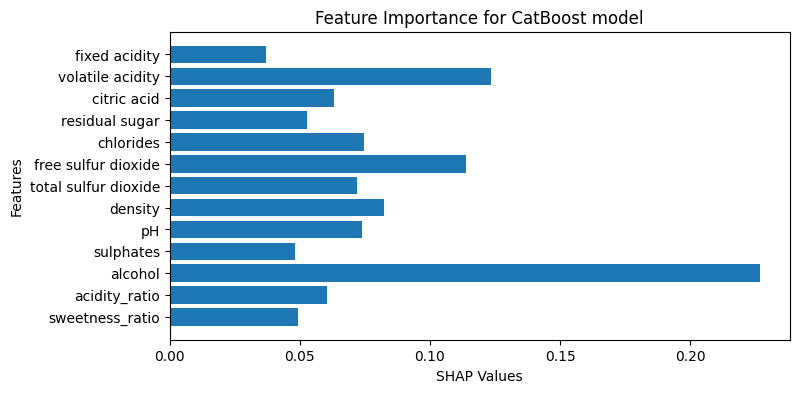

In [ ]:
explainer = shap.TreeExplainer(cat_model)
shap_values = explainer.shap_values(X_test)

shap_values_abs = np.abs(shap_values)
shap_values_mean = shap_values_abs.mean(axis=0)

assert len(shap_values_mean) == len(X_train.columns)
plt.figure(figsize=(8, 4))
plt.barh(range(len(X_train.columns)), shap_values_mean, align='center')
plt.yticks(range(len(X_train.columns)), X_train.columns)
plt.xlabel('SHAP Values')
plt.ylabel('Features')
plt.title('Feature Importance for CatBoost model')
plt.gca().invert_yaxis()
plt.show()

In [ ]:
cat_explainer = lime_tabular.LimeTabularExplainer(training_data=np.array(X_train), feature_names=X_train.columns, mode='regression')
cat_exp = cat_explainer.explain_instance(data_row=X_test.iloc[3], predict_fn=cat_model.predict)
cat_exp.show_in_notebook(show_table=True)

Predictive Modeling

In [ ]:
rf_pred = rf_model.predict(X_test)
rf_mse = mean_squared_error(y_test, rf_pred)
print(f"Mean Squared Error: {rf_mse}")
rf_r2 = r2_score(y_test, rf_pred)
print(f"R-squared score: {rf_r2}")

Mean Squared Error: 0.35370193877551015
R-squared score: 0.5432999257869009


In [ ]:
param_grid = {
    'n_estimators': [100, 200, 300],
    'max_features': [ 'sqrt', 'log2'],
    'max_depth' : [4, 6, 8],
    'min_samples_split': [2, 5, 10],
    'min_samples_leaf': [1, 2, 4],
}

# Set up the grid search
CV_rf = GridSearchCV(estimator=rf_model, param_grid=param_grid, cv= 3)

# Fit the grid search to the data
CV_rf.fit(X_train, y_train)

# Print the best parameters and best score
print('Best parameters found:', CV_rf.best_params_)

Best parameters found: {'max_depth': 8, 'max_features': 'sqrt', 'min_samples_leaf': 2, 'min_samples_split': 2, 'n_estimators': 300}


In [ ]:
cv_params= CV_rf.best_params_
rf_model_cv = RandomForestRegressor(**cv_params, random_state=42)
rf_model_cv.fit(X_train, y_train)

rf_model_cv_pred = rf_model_cv.predict(X_test)
rf_model_cv_pred_r2 = r2_score(y_test, rf_model_cv_pred)
print("Tuned Random Forest R2 score:", rf_model_cv_pred_r2)

rf_model_cv_pred_mse = mean_squared_error(y_test, rf_model_cv_pred)
print("Tuned Random Forest MSE:", rf_model_cv_pred_mse)

Tuned Random Forest R2 score: 0.4193491771062887
Tuned Random Forest MSE: 0.44969846383968565


In [ ]:
cat_pred = cat_model.predict(X_test)
cat_mse = mean_squared_error(y_test, cat_pred)
print(f"Mean Squared Error: {cat_mse}")
cat_r2 = r2_score(y_test, cat_pred)
print(f"R-squared score: {cat_r2}")
from sklearn.metrics import accuracy_score
accuracy_catboost = accuracy_score(y_test, cat_pred)
print("CatBoost Classifier Accuracy:", accuracy_catboost)

Mean Squared Error: 0.47346938775510206
R-squared score: 0.3886561513517002
CatBoost Classifier Accuracy: 0.6448979591836734


In [ ]:
param_grid = {
    'depth': [4, 8, 12],
    'learning_rate': [0.01, 0.05, 0.1],
    'iterations': [50, 75, 100],
    'l2_leaf_reg': [2, 4, 8]
}
cat_cv = GridSearchCV(cat_model, param_grid, cv=3, scoring='neg_mean_squared_error', verbose=2)
cat_cv.fit(X_train, y_train)

print('Best parameters found:', cat_cv.best_params_)

Streaming output truncated to the last 5000 lines.
33:	learn: 0.5986152	total: 5.17s	remaining: 2.43s
34:	learn: 0.5955005	total: 5.26s	remaining: 2.25s
35:	learn: 0.5913680	total: 5.36s	remaining: 2.08s
36:	learn: 0.5892157	total: 5.47s	remaining: 1.92s
37:	learn: 0.5870979	total: 5.56s	remaining: 1.76s
38:	learn: 0.5841974	total: 5.65s	remaining: 1.59s
39:	learn: 0.5808954	total: 5.76s	remaining: 1.44s
40:	learn: 0.5784910	total: 5.86s	remaining: 1.29s
41:	learn: 0.5767143	total: 5.95s	remaining: 1.13s
42:	learn: 0.5744951	total: 6.06s	remaining: 987ms
43:	learn: 0.5732402	total: 6.15s	remaining: 839ms
44:	learn: 0.5704534	total: 6.25s	remaining: 694ms
45:	learn: 0.5684978	total: 6.37s	remaining: 554ms
46:	learn: 0.5672236	total: 6.49s	remaining: 414ms
47:	learn: 0.5652467	total: 6.59s	remaining: 275ms
48:	learn: 0.5617700	total: 6.7s	remaining: 137ms
49:	learn: 0.5596760	total: 6.82s	remaining: 0us
[CV] END depth=12, iterations=50, l2_leaf_reg=8, learning_rate=0.1; total time=   6.9

In [ ]:
cat_cv_params= cat_cv.best_params_
cat_model_cv = CatBoostRegressor(**cat_cv_params, random_state=42)
cat_model_cv.fit(X_train, y_train)

cat_model_cv_pred = cat_model_cv.predict(X_test)

cat_model_cv_pred_r2 = r2_score(y_test, cat_model_cv_pred)
print("Tuned CatBoost R2 score:", cat_model_cv_pred_r2)

cat_model_cv_pred_mse = mean_squared_error(y_test, cat_model_cv_pred)
print("Tuned CatBoost MSE:", cat_model_cv_pred_mse)

0:	learn: 0.8576334	total: 109ms	remaining: 10.8s
1:	learn: 0.8312384	total: 218ms	remaining: 10.7s
2:	learn: 0.8060331	total: 328ms	remaining: 10.6s
3:	learn: 0.7875152	total: 430ms	remaining: 10.3s
4:	learn: 0.7659564	total: 543ms	remaining: 10.3s
5:	learn: 0.7452248	total: 674ms	remaining: 10.6s
6:	learn: 0.7287473	total: 871ms	remaining: 11.6s
7:	learn: 0.7088470	total: 1.08s	remaining: 12.4s
8:	learn: 0.6925286	total: 1.27s	remaining: 12.8s
9:	learn: 0.6784408	total: 1.43s	remaining: 12.9s
10:	learn: 0.6651993	total: 1.63s	remaining: 13.2s
11:	learn: 0.6544920	total: 1.82s	remaining: 13.3s
12:	learn: 0.6449705	total: 2s	remaining: 13.4s
13:	learn: 0.6364588	total: 2.17s	remaining: 13.3s
14:	learn: 0.6268527	total: 2.35s	remaining: 13.3s
15:	learn: 0.6176030	total: 2.52s	remaining: 13.2s
16:	learn: 0.6091609	total: 2.68s	remaining: 13.1s
17:	learn: 0.6005633	total: 2.86s	remaining: 13s
18:	learn: 0.5920427	total: 3.02s	remaining: 12.9s
19:	learn: 0.5858948	total: 3.21s	remaining: 1

In [ ]:
svr_model = SVR(kernel='rbf', C=1.0, epsilon=0.1)
svr_model.fit(X_train, y_train)

SVR()

In [ ]:
svr_pred = svr_model.predict(X_test)

svr_mse = mean_squared_error(y_test, svr_pred)
print(f"Mean Squared Error: {svr_mse}")
svr_r2 = r2_score(y_test, svr_pred)
print(f"R-squared score: {svr_r2}")

Mean Squared Error: 0.6507734721378315
R-squared score: 0.15972105199599174


In [ ]:
param_grid = {
    'C': [0.1, 1, 10, 100],
    'kernel': ['rbf', 'linear', 'poly'],
    'gamma': ['scale', 'auto', 0.01, 0.1, 1],
    'epsilon': [ 0.1, 0.5, 1, 2]
}
svr_cv = GridSearchCV(svr_model, param_grid, cv=3, scoring='neg_mean_squared_error', verbose=2, n_jobs=-1)
svr_cv.fit(X_train, y_train)
print('Best parameters found:', svr_cv.best_params_)

In [ ]:
svr_cv_params= svr_cv.best_params_
svr_model_cv = SVR(**svr_cv_params, random_state=42)
svr_model_cv.fit(X_train, y_train)

svr_model_cv_pred = svr_model_cv.predict(X_test)

svr_model_cv_pred_r2 = r2_score(y_test, svr_model_cv_pred)
print("Tuned SVR R2 score:", svr_model_cv_pred_r2)

svr_model_cv_pred_mse = mean_squared_error(y_test, svr_model_cv_pred)
print("Tuned SVR MSE:", svr_model_cv_pred_mse)

In [ ]:
MSE = [cat_model_cv_pred_mse, rf_mse, svr_model_cv_pred_mse]
R2 = [cat_model_cv_pred_r2, rf_r2, svr_model_cv_pred_r2]

table = pd.DataFrame({'Mean Squared Error': MSE, 'R-2 score': R2}, index=['CatBoost', 'Random Forest','SVR'])
print(table)

               Mean Squared Error  R-2 score
CatBoost                 0.473469   0.388656
Random Forest            0.369775   0.522546
SVR                      0.470856   0.392030
